**Including the Test Data set from the Internet to the tmp Folder**

In [1]:
!wget --no-check-certificate \
    https://storage.googleapis.com/laurencemoroney-blog.appspot.com/horse-or-human.zip \
    -O /tmp/horse-or-human.zip

--2020-06-10 01:01:56--  https://storage.googleapis.com/laurencemoroney-blog.appspot.com/horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.111.128, 2607:f8b0:4001:c01::80
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.111.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149574867 (143M) [application/zip]
Saving to: ‘/tmp/horse-or-human.zip’

/tmp/horse-or-human 100%[===================>] 142.65M   111MB/s    in 1.3s    

2020-06-10 01:01:57 (111 MB/s) - ‘/tmp/horse-or-human.zip’ saved [149574867/149574867]



**Including the Validated Data set from the Internet to the tmp Folder**

In [2]:
!wget --no-check-certificate \
    https://storage.googleapis.com/laurencemoroney-blog.appspot.com/validation-horse-or-human.zip \
    -O /tmp/validation-horse-or-human.zip

--2020-06-10 01:02:05--  https://storage.googleapis.com/laurencemoroney-blog.appspot.com/validation-horse-or-human.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.202.128, 2607:f8b0:4001:c05::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.202.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 11480187 (11M) [application/zip]
Saving to: ‘/tmp/validation-horse-or-human.zip’

/tmp/validation-hor 100%[===================>]  10.95M  66.0MB/s    in 0.2s    

2020-06-10 01:02:05 (66.0 MB/s) - ‘/tmp/validation-horse-or-human.zip’ saved [11480187/11480187]



**Unzip the Data Sets**

In [0]:
import os
import zipfile

# extract test zip
local_zip='/tmp/horse-or-human.zip'
zip_ref=zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/horse-or-human')

# extract validation zip
local_zip='/tmp/validation-horse-or-human.zip'
zip_ref=zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/validation-horse-or-human')
zip_ref.close()

**To read images from subdirectories, and automatically label them from the name of that subdirectory**

In [0]:
# Directory with our training horse pictures
train_horse_dir=os.path.join('/tmp/horse-or-human/horses')

# Directory with our training human pictures
train_human_dir=os.path.join('/tmp/horse-or-human/humans')

# Directory with our validation horse pictures
validation_horse_dir=os.path.join('/tmp/validation-horse-or-human/horses')

# Directory with our training human pictures
validation_human_dir=os.path.join('/tmp/validation-horse-or-human/humans')


**Print the Training Directory Data**

In [7]:
# For training datasets
train_horse_names=os.listdir(train_horse_dir)
print(train_horse_names[:10])

train_human_names=os.listdir(train_human_dir)
print(train_human_names[:10])

# For validation datasets
validation_horse_names=os.listdir(validation_horse_dir)
print(validation_horse_names[:10])

validation_human_names=os.listdir(validation_human_dir)
print(validation_human_names[:10])

['horse50-5.png', 'horse24-6.png', 'horse43-4.png', 'horse49-0.png', 'horse15-3.png', 'horse31-3.png', 'horse27-4.png', 'horse50-9.png', 'horse05-7.png', 'horse32-0.png']
['human05-29.png', 'human03-10.png', 'human05-15.png', 'human09-20.png', 'human06-14.png', 'human07-17.png', 'human11-23.png', 'human14-25.png', 'human03-16.png', 'human05-08.png']
['horse4-014.png', 'horse3-099.png', 'horse2-314.png', 'horse1-000.png', 'horse2-069.png', 'horse3-484.png', 'horse6-275.png', 'horse5-123.png', 'horse4-599.png', 'horse3-070.png']
['valhuman05-27.png', 'valhuman04-09.png', 'valhuman03-05.png', 'valhuman05-22.png', 'valhuman05-23.png', 'valhuman01-14.png', 'valhuman04-13.png', 'valhuman05-21.png', 'valhuman05-05.png', 'valhuman04-06.png']


**Findout Total No of Horse and Human Images**

In [8]:
# For training
print('total training horse images',len(train_horse_names))
print('total training human images',len(train_human_names))

# For validation
print('total validation horse images',len(validation_horse_names))
print('total validation human images',len(validation_human_names))

total training horse images 500
total training human images 527
total validation horse images 128
total validation human images 128


**Visualize the Images**

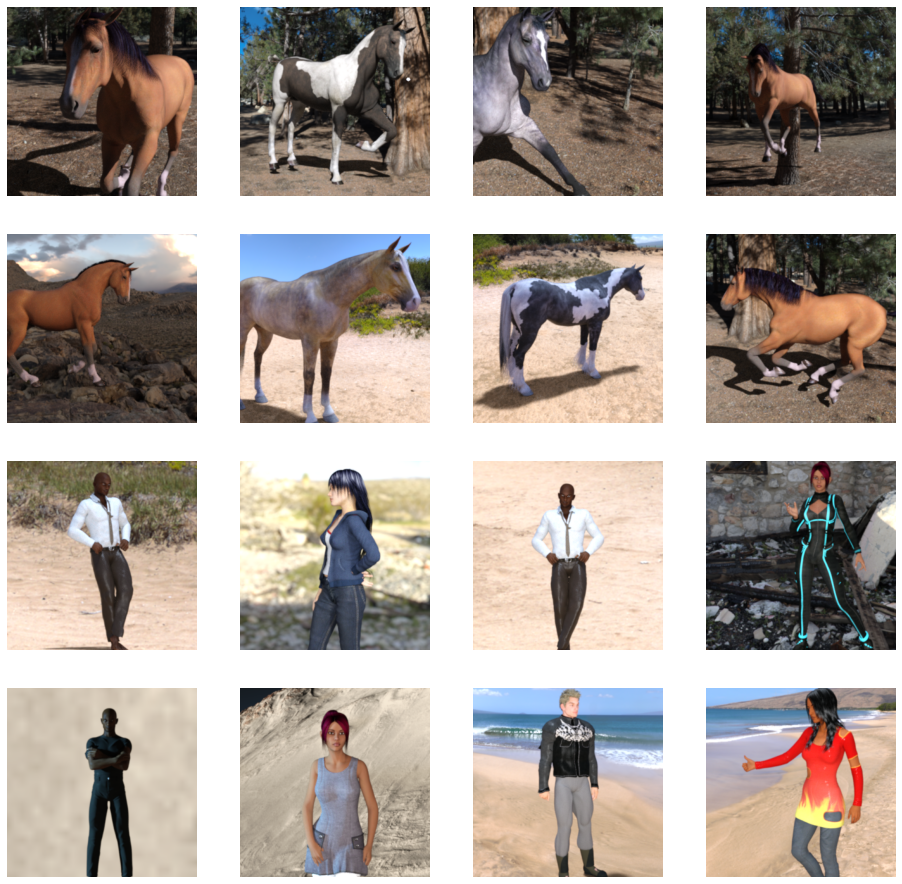

In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Output the images in 4 X 4 configuration
nrows=4
ncols=4

# index for iterating over images
pic_index=0

# Set up matplotlib fig, and size it to fit 4X4 pics
fig=plt.gcf()
fig.set_size_inches(ncols*4, nrows*4)

pic_index+=8;

next_horse_pix=[os.path.join(train_horse_dir, fname) for fname in train_horse_names[pic_index-8:pic_index]]
next_human_pix=[os.path.join(train_human_dir, fname) for fname in train_human_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_horse_pix+next_human_pix):
  # set up subplot starting index at 1
  sp=plt.subplot(nrows, ncols, i+1)
  sp.axis('off')

  img=mpimg.imread(img_path)
  plt.imshow(img)
plt.show()

**Model Building using Tensor Flow**

In [13]:
# step 1: import tensor flow
import tensorflow as tf

# step 2: create densely connected layers
model=tf.keras.models.Sequential([
                                  # the input shape is the desired size of the image 150x150 with 3 bytes color
                                  # the first convolution layer
                                  tf.keras.layers.Conv2D(16,(3,3),activation='relu',input_shape=(150,150,3)),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # the second convolution layer
                                  tf.keras.layers.Conv2D(32,(3,3),activation='relu'),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # the third convolution layer
                                  tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
                                  tf.keras.layers.MaxPooling2D(2,2),
                                  # # the fourth convolution layer
                                  # tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
                                  # tf.keras.layers.MaxPooling2D(2,2),
                                  # # the fifth convolution layer
                                  # tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
                                  # tf.keras.layers.MaxPooling2D(2,2),
                                  # flatten the layer to feed into the DNN
                                  tf.keras.layers.Flatten(),
                                  # 512 neurons hidden layers
                                  tf.keras.layers.Dense(512, activation='relu'),
                                  # only the one output layer that will be a value from 0-1 where 0 is for 'horses' and 1 is for 'humans'
                                  tf.keras.layers.Dense(1, activation='sigmoid')
])

# step 3: Create a model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 148, 148, 16)      448       
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 74, 74, 16)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 72, 72, 32)        4640      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 36, 36, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 34, 34, 64)        18496     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 17, 17, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 18496)            

**Compile the Model**

In [0]:
# Step - 4: compile the model

# import the desired library
from tensorflow.keras.optimizers import RMSprop

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=0.001),
              metrics=['accuracy'])

**Data Preprocessing**

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Images go into the neural networks be normalized to make it amenable for processing by the network
train_datagen=ImageDataGenerator(rescale=1/255) # train purpose
validation_datagen=ImageDataGenerator(rescale=1/255) # validation purpose

# Flow the training images as a batch 
# training
train_generator=train_datagen.flow_from_directory(
        '/tmp/horse-or-human/',  # the source directory for training the images
         target_size=(150,150),  # All the images will be resized as the model
         batch_size=128,
         class_mode='binary'     # binary_crossentropy is used as loss
         )

# Flow the training images as a batch 
# validation
validation_generator=validation_datagen.flow_from_directory(
        '/tmp/validation-horse-or-human/',  # the source directory for training the images
         target_size=(150,150),  # All the images will be resized as the model
         batch_size=128,
         class_mode='binary'     # binary_crossentropy is used as loss
         )

Found 1027 images belonging to 2 classes.
Found 256 images belonging to 2 classes.


**Training**

In [18]:
history=model.fit(
    train_generator,
    steps_per_epoch=8,
    epochs=15,
    verbose=1,
    validation_data=validation_generator,
    validation_steps=8    
)

Epoch 1/15
8/8 [==============================] - 21s 3s/step - loss: 2.7975 - accuracy: 0.4950 - val_loss: 0.6133 - val_accuracy: 0.7773
Epoch 2/15
8/8 [==============================] - 21s 3s/step - loss: 0.5803 - accuracy: 0.6485 - val_loss: 0.3281 - val_accuracy: 0.8906
Epoch 3/15
8/8 [==============================] - 21s 3s/step - loss: 0.5483 - accuracy: 0.7653 - val_loss: 1.1674 - val_accuracy: 0.5312
Epoch 4/15
8/8 [==============================] - 21s 3s/step - loss: 0.3894 - accuracy: 0.8343 - val_loss: 0.7517 - val_accuracy: 0.7656
Epoch 5/15
8/8 [==============================] - 21s 3s/step - loss: 0.1583 - accuracy: 0.9466 - val_loss: 1.6588 - val_accuracy: 0.7383
Epoch 6/15
8/8 [==============================] - 23s 3s/step - loss: 0.1051 - accuracy: 0.9619 - val_loss: 1.4221 - val_accuracy: 0.7227
Epoch 7/15
8/8 [==============================] - 21s 3s/step - loss: 0.0882 - accuracy: 0.9711 - val_loss: 0.5075 - val_accuracy: 0.8125
Epoch 8/15
8/8 [==================

**To Upload the Image for the Predicton**

In [20]:
import numpy as np
from google.colab import files
from keras.preprocessing import image

uploaded=files.upload()

for fn in uploaded.keys():
  # predicting images
  path='/content/'+fn
  img=image.load_img(path, target_size=(150,150))
  x=image.img_to_array(img)
  x=np.expand_dims(x, axis=0)

  images=np.vstack([x])
  classes=model.predict(images, batch_size=10)
  print(classes[0])
  
  if classes[0]>0.5:
    print(fn+'is a human')
  else:
    print(fn+'is a horse')

Saving girl-sitting-on-a-white-horse-by-the-sea-michal-bednarek.jpg to girl-sitting-on-a-white-horse-by-the-sea-michal-bednarek.jpg
[2.2161254e-24]
girl-sitting-on-a-white-horse-by-the-sea-michal-bednarek.jpgis a horse


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: RuntimeWarning: invalid value encountered in true_divide


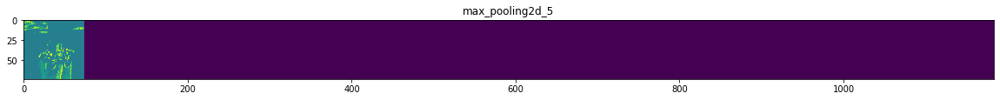

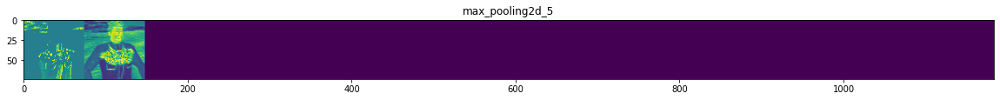

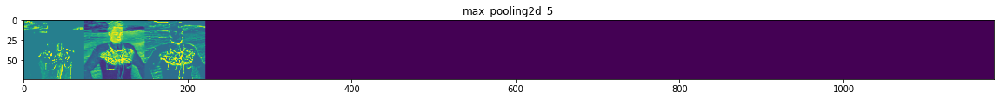

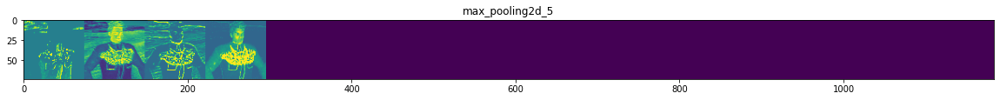

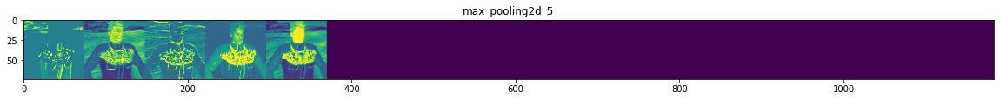

...

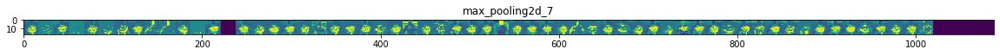

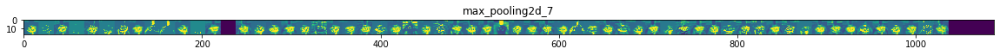

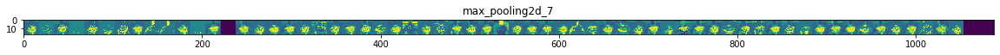

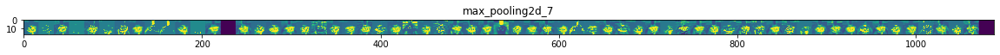

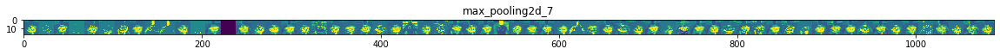

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# The model will take an image as input, and will output intermedicate representation
successive_outputs=[layer.output for layer in model.layers[1:]]

# visualization_model=Model(img_input, successive_outputs)
visualization_model=tf.keras.models.Model(inputs=model.input, outputs=successive_outputs)

# random input image from the training set
horse_img_files=[os.path.join(train_horse_dir, f) for f in train_horse_names]
human_img_files=[os.path.join(train_human_dir, f) for f in train_human_names]
img_path=random.choice(horse_img_files+human_img_files)

img=load_img(img_path, target_size=(150, 150)) # for PIL(Python Imaging Library) image
x=img_to_array(img) # numpy with the shape as input
x=x.reshape((1,)+x.shape) # numpy array with the shape (1, 150, 150, 3)

# rescale x
x/=255

# network for the intermediate representation of the images
successive_feature_maps=visualization_model.predict(x)

# The names of the layers as part of the plot
layer_names=[layer.name for layer in model.layers[1:]]

# Display the representation
for layer_name, feature_map in zip(layer_names,successive_feature_maps):
  if len(feature_map.shape)==4:
    # for the con / maxpool layers, not the fully connected layers
    n_features=feature_map.shape[-1] # no of features in feature map
    # the feature map has shape(1, size, size, n_features)
    size=feature_map.shape[1]
    # title the image in the matrix
    display_grid=np.zeros((size, size*n_features))
    for i in range(n_features):
      # postprocess the feature to make it visible
      x=feature_map[0,:,:,i]
      x-=x.mean()
      x/=x.std()
      x*=64
      x+=128
      x=np.clip(x,0,255).astype('uint8')
      # Tile each filter into the big horizontal grid
      display_grid[:,i*size:(i+1)*size]=x
      # Display the grid
      scale=20./n_features
      plt.figure(figsize=(scale*n_features, scale))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid,aspect='auto', cmap='viridis')

**Clear Up for Free Memory Resources**

In [0]:
import os, signal
os.kill(os.getpid(), signal.SIGKILL)